In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import vgg19
import numpy as np
import os
import pdb

In [2]:
style_image_path = keras.utils.get_file("staryy_night.jpg","https://cdn.britannica.com/78/43678-050-F4DC8D93/Starry-Night-canvas-Vincent-van-Gogh-New-1889.jpg")
content_image_path = keras.utils.get_file("night_city.jpg","https://images.unsplash.com/photo-1611416517780-eff3a13b0359?ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxzZWFyY2h8NHx8Y2l0eSUyMGF0JTIwbmlnaHR8ZW58MHx8MHx8fDA%3D&w=1000&q=80")

total_variation_weight = 1e-6
style_weight = 1e-6
content_weight = 2.5e-8
width, height = keras.preprocessing.image.load_img(content_image_path).size
img_nrows=400
img_ncols = int(width*img_nrows/height)


100829/100829 [==============================] - 0s 0us/step


In [3]:
def preprocess_image(image_path):
  img = keras.preprocessing.image.load_img(image_path, target_size=(img_nrows, img_ncols))
  img = keras.utils.img_to_array(img)
  img = np.expand_dims(img, axis=0)
  np.expand_dims(img, axis=0)
  img = vgg19.preprocess_input(img)
  return tf.convert_to_tensor(img)

def deprocess_image(img):
  img = img.reshape((img_nrows, img_ncols,3))
  img[:, :, 0] += 103.939
  img[:, :, 1] += 116.779
  img[:, :, 2] += 123.68

  img = img[:, :, ::-1]
  img = np.clip(img, 0 ,255).astype("uint8")
  return img


In [4]:
def gram_matrix(x):
  x = tf.transpose(x,(2,0,1))
  features = tf.reshape(x, (tf.shape(x)[0],-1))
  gram = tf.matmul(features, tf.transpose(features))
  return gram

def style_loss(style, generated):
  style_gram = gram_matrix(style)
  generated_gram = gram_matrix(generated)
  channels = 3
  size = img_nrows * img_ncols
  return tf.reduce_sum(tf.square(style_gram-generated_gram)/(4.0*(channels**2)*(size**2)))

def content_loss(base, generated):
  return tf.reduce_sum(tf.square(generated-base))

def total_variation_loss(x):
  a = tf.square(x[:, : img_nrows-1, : img_ncols-1, :] - x[:, 1:, :img_ncols-1, :])
  b = tf.square(x[:, : img_nrows-1, : img_ncols-1, :] - x[:, :img_nrows -1, 1:, :])
  return tf.reduce_sum(tf.pow(a+b, 1.25))


In [5]:
model = vgg19.VGG19(weights="imagenet", include_top=False)

style_layers = [
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1",
]

content_layer = "block5_conv2"

layer_names = style_layers+[content_layer]

outputs_dict = dict([(layer.name,layer.output) for layer in model.layers if layer.name in layer_names])

feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)



def compute_loss(generated_image, base_image, style_image):
  input_tensor = tf.concat(
      [base_image, style_image, generated_image], axis=0
  )

  features = feature_extractor(input_tensor)

  loss = tf.zeros(shape=())

  layer_features = features[content_layer]
  content_image_features = layer_features[0, :, :, :]
  generated_features = layer_features[2, :, :, :]
  loss += content_weight*content_loss(content_image_features, generated_features)

  for layer_name in style_layers:
    layer_features = features[layer_name]
    style_features = layer_features[1, :, :, :]
    generated_features = layer_features[2, : , :, :]
    s_loss = style_loss(style_features, generated_features)
    loss += (style_weight / len(style_layers))*s_loss

  loss+=total_variation_weight * total_variation_loss(generated_image)
  return loss


In [6]:
@tf.function
def compute_loss_and_gradients(generated_image, content_image, style_image):
  with tf.GradientTape() as tape:
    loss = compute_loss(generated_image, content_image, style_image)

  grads = tape.gradient(loss, generated_image)
  return loss, grads

optimizer = keras.optimizers.SGD(keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=100.0, decay_steps=100, decay_rate = 0.95
))

def train(content_image_path, style_image_path, content_weight, style_weight, variation_weight, image_name):
  content_image = preprocess_image(content_image_path)
  style_image = preprocess_image(style_image_path)
  generated_image = tf.Variable(preprocess_image(content_image_path))

  EPOCHS = 2000

  for i in range(EPOCHS):
    loss, grads = compute_loss_and_gradients(generated_image, content_image, style_image)
    optimizer.apply_gradients([(grads, generated_image)])
    if i%100 == 0:
      print("Iteration ",i,", loss:",loss)
      img = deprocess_image(generated_image.numpy())
      tf.keras.preprocessing.image.array_to_img(img).show()

    keras.preprocessing.image.save_img(image_name,img)

Iteration  0 , loss: tf.Tensor(107276.5, shape=(), dtype=float32)


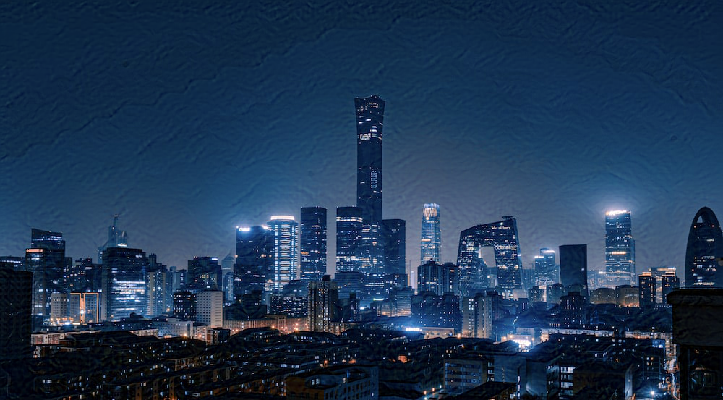

Iteration  100 , loss: tf.Tensor(8718.713, shape=(), dtype=float32)


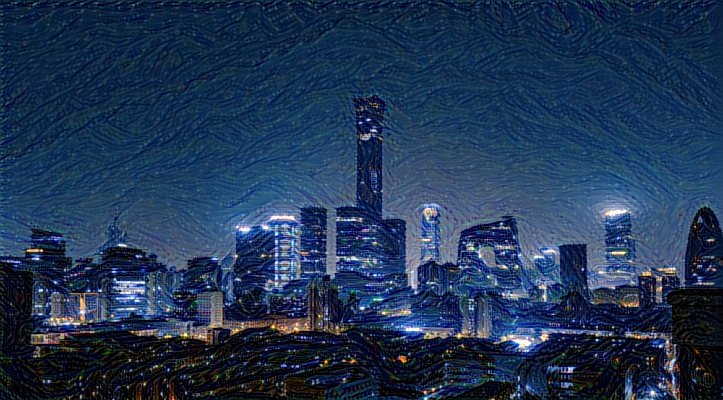

Iteration  200 , loss: tf.Tensor(7236.2236, shape=(), dtype=float32)


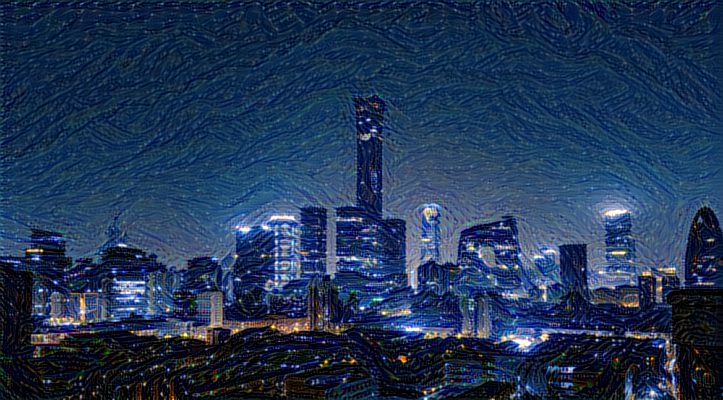

Iteration  300 , loss: tf.Tensor(6645.4604, shape=(), dtype=float32)


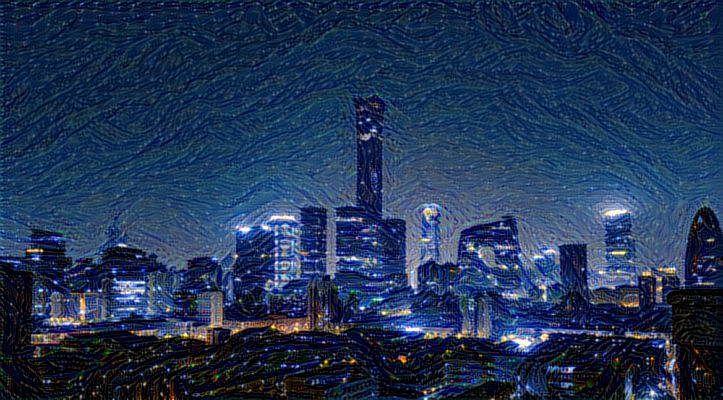

Iteration  400 , loss: tf.Tensor(6323.9717, shape=(), dtype=float32)


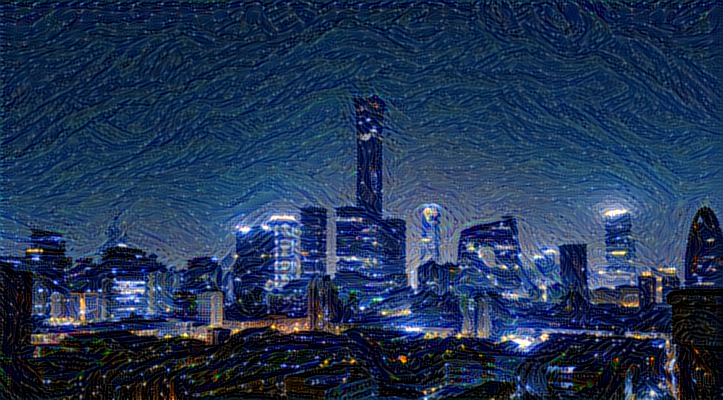

Iteration  500 , loss: tf.Tensor(6120.0615, shape=(), dtype=float32)


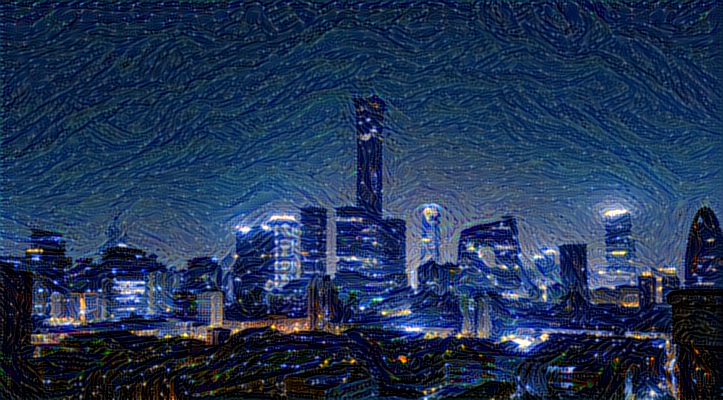

Iteration  600 , loss: tf.Tensor(5977.9375, shape=(), dtype=float32)


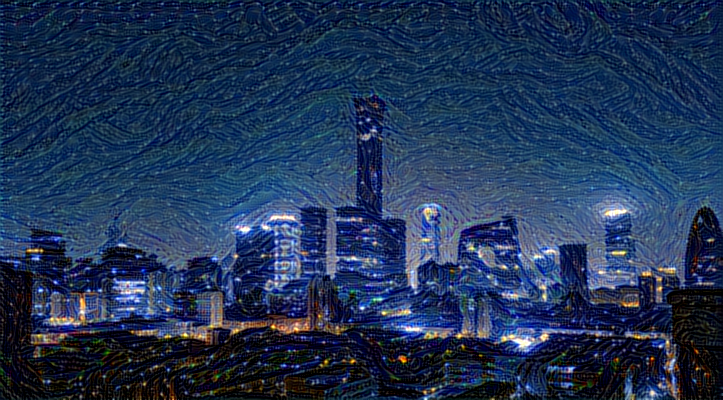

Iteration  700 , loss: tf.Tensor(5872.42, shape=(), dtype=float32)


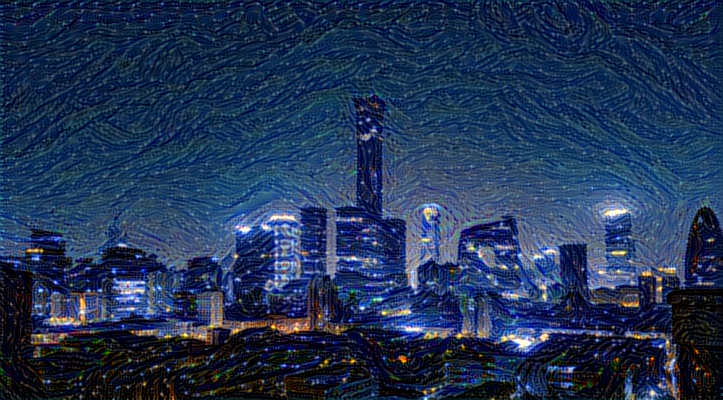

Iteration  800 , loss: tf.Tensor(5790.599, shape=(), dtype=float32)


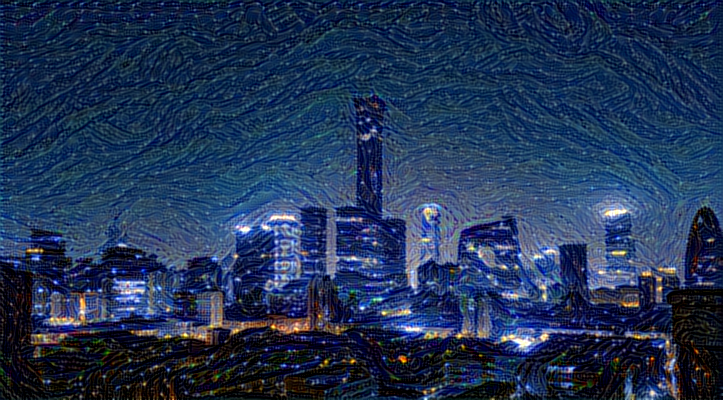

Iteration  900 , loss: tf.Tensor(5724.9062, shape=(), dtype=float32)


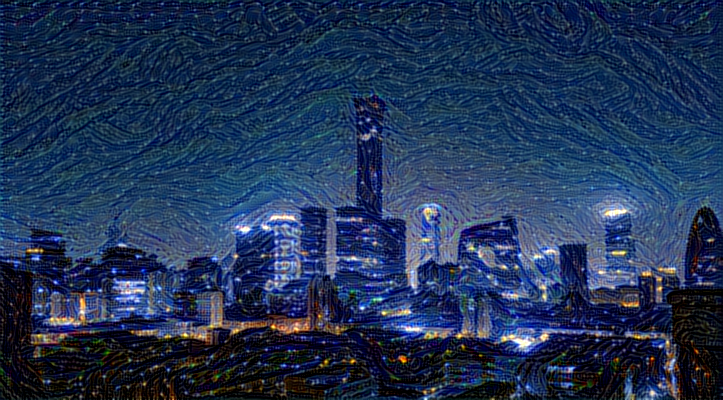

Iteration  1000 , loss: tf.Tensor(5670.823, shape=(), dtype=float32)


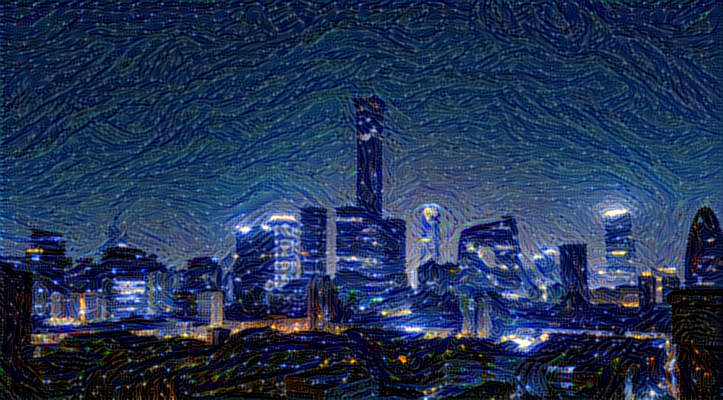

Iteration  1100 , loss: tf.Tensor(5625.5273, shape=(), dtype=float32)


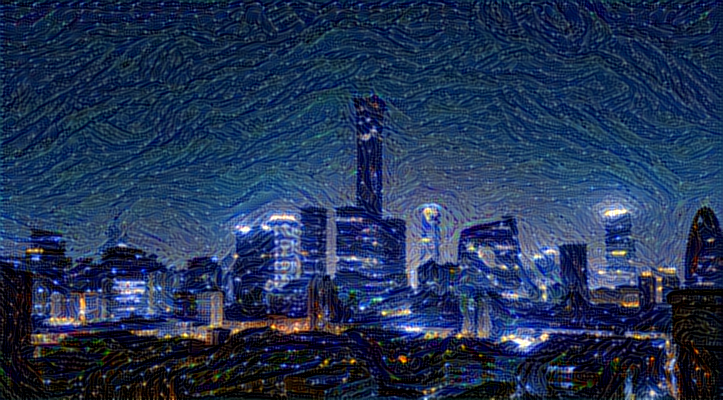

Iteration  1200 , loss: tf.Tensor(5587.108, shape=(), dtype=float32)


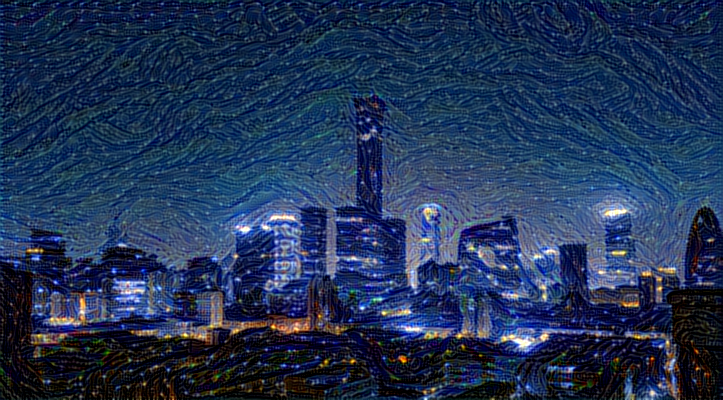

Iteration  1300 , loss: tf.Tensor(5553.9893, shape=(), dtype=float32)


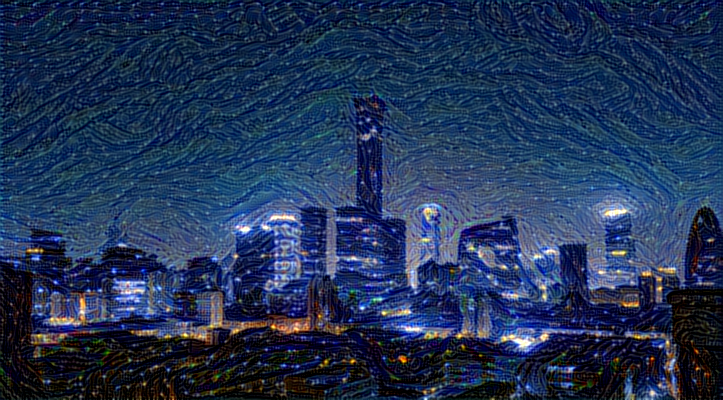

Iteration  1400 , loss: tf.Tensor(5525.036, shape=(), dtype=float32)


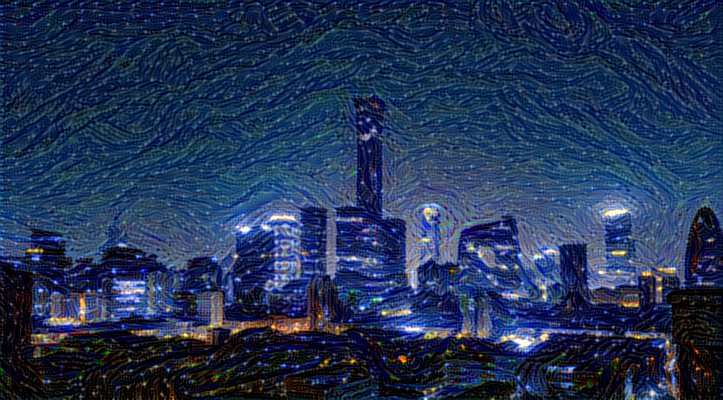

Iteration  1500 , loss: tf.Tensor(5499.59, shape=(), dtype=float32)


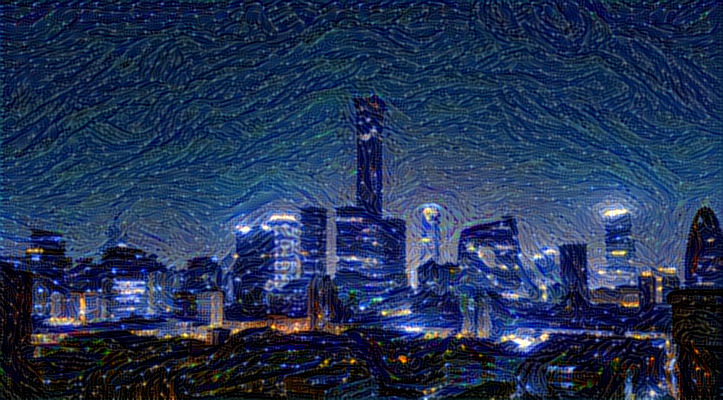

Iteration  1600 , loss: tf.Tensor(5477.0215, shape=(), dtype=float32)


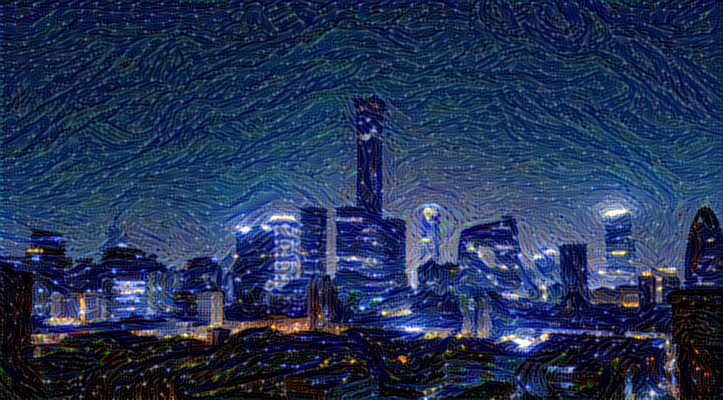

Iteration  1700 , loss: tf.Tensor(5456.88, shape=(), dtype=float32)


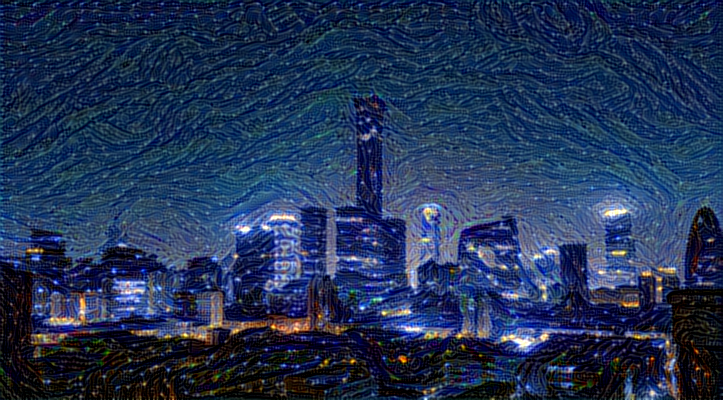

Iteration  1800 , loss: tf.Tensor(5438.7896, shape=(), dtype=float32)


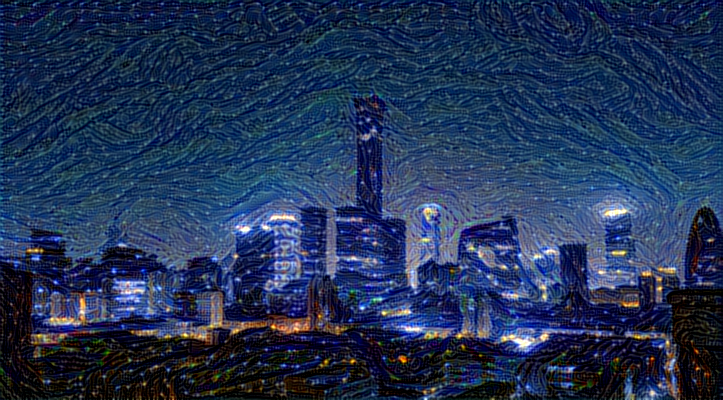

Iteration  1900 , loss: tf.Tensor(5422.5366, shape=(), dtype=float32)


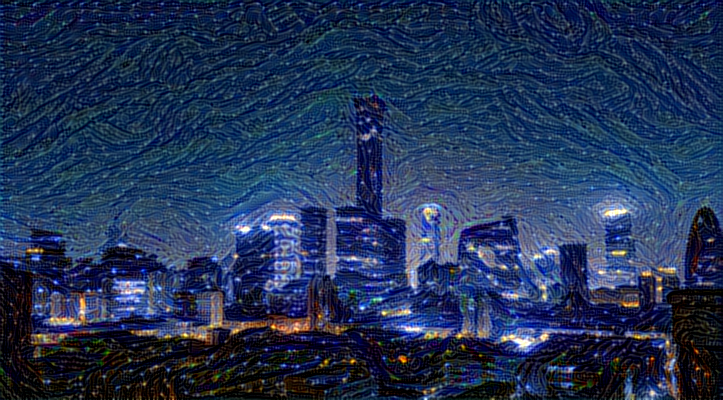

In [7]:
train(content_image_path, style_image_path, content_weight, style_weight, total_variation_weight, "citadel2.jpg" )

